# Описание проекта <a id='intro_0'></a>
Инвесторы из фонда «Shut Up and Take My Money» решили открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
Для начала они просят подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года (файл moscow_places.csv). Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

Описание данных:

`middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:

Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.

Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.

Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

`middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:

Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.

Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.

Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

`chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):

0 — заведение не является сетевым

1 — заведение является сетевым

**Для выполнения проекта необходимо**

[Шаг 1. Загрузить данные и изучить общую информацию](#intro_1)

[Шаг 2. Выполнить предобработку данных](#intro_2)

[Шаг 3. Анализ данных](#intro_3)

[Шаг 4. Детализировать исследование](#intro_4)

[ОБЩИЙ ВЫВОД](#intro_5)

[Презентация](#intro_6)
_____
# Project Description <a id='intro_0.0'></a>
Investors from the Shut Up and Take My Money fund decided to open a catering establishment in Moscow. Customers do not yet know what kind of place it will be: a cafe, a restaurant, a pizzeria, a pub or a bar, and what the location, menu and prices will be. To begin with, they ask to prepare a study of the Moscow market, find interesting features and present the results obtained, which in the future will help in choosing a suitable place for investors.

A dataset with Moscow catering establishments is available, compiled on the basis of data from Yandex Maps and Yandex Business services for the summer of 2022 (moscow_places.csv file). The information posted in the Yandex Business service could have been added by users or found in publicly available sources. It is purely for reference purposes.

Data description:

middle_avg_bill — a number with an average check score, which is specified only for values from the avg_bill column starting with the substring "Average bill":

If a price range of two values is specified in the row, the median of these two values will be included in the column.

If a single number is specified in the row — the price without a range, then this number will be included in the column.

If there is no value or it does not start with the substring "Average score", then nothing will be included in the column.

middle_coffee_cup is a number with the rating of one cup of cappuccino, which is specified only for values from the avg_bill column starting with the substring "Price of one cup of cappuccino":

If a price range of two values is specified in the row, the median of these two values will be included in the column.

If a single number is specified in the row — the price without a range, then this number will be included in the column.

If there is no value or it does not start with the substring "Price of one cup of cappuccino", then nothing will be included in the column.

chain — a number expressed as 0 or 1, which indicates whether the institution is a network (errors may occur for small networks):

0 — the institution is not a network

1 — the institution is a network

**To complete the project, it is necessary**

[Step 1. Download the data and study the general information](#intro_1.1)

[Step 2. Data preprocessing](#intro_1.2)

[Step 3. Data Analysis](#intro_1.3)

[Step 4. Detail the study](#intro_1.4)

[GENERATE CONCLUSION](#intro_1.5)

# Шаг 1. Загрузите данные и изучите общую информацию <a id='intro_1'></a>
Путь к файлу: /datasets/moscow_places.csv.

Сколько заведений представлено? 

Что можно сказать о каждом столбце? 

Значения какого типа они хранят?
___

# Step 1. Upload the data and study the general information <a id='intro_1.1'></a>
File path: /datasets/moscow_places.csv.

How many establishments are represented? 

What can be said about each column? 

What type of values do they store?

In [1]:
#импортируем библиотеки
#import libraries
import pandas as pd
import re
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from plotly import graph_objects as go

In [2]:
#читаем датасет
#read dataset
places_df = pd.read_csv('/datasets/moscow_places.csv')
#смотрим таблицу
#look at the table
places_df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


Так, таблица с заведениями общественного питания Москвы имеет следующие значения:

`name` — название заведения;

`address` — адрес заведения;

`category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;

`hours` — информация о днях и часах работы;

`lat` — широта географической точки, в которой находится заведение;

`lng` — долгота географической точки, в которой находится заведение;

`rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);

`price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;

`avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона

`middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill

`middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill

`chain` — число, определяющее, является ли заведение сетевым (0 - нет, 1 - да) 

`district` — административный район, в котором находится заведение, например Центральный административный округ;

`seats` — количество посадочных мест.

Названия колонок понятны и прописаны в едином стиле. 

Имеются пропущенные значения. Необходима предобработка.

# Шаг 2. Предобработка данных  <a id='intro_2'></a>
* Изучите дубликаты в данных, поищите пропуски.
* Выполните предобработку данных:

Создайте столбец `street` с названиями улиц из столбца с адресом.

Создайте столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
логическое значение True — если заведение работает ежедневно и круглосуточно;
логическое значение False — в противоположном случае.
___

# Step 2. Data preprocessing  <a id='intro_1.2'></a>
* Examine the duplicates in the data, look for omissions.
* Perform data preprocessing:

Create a `street` column with street names from the address column.

Create a column `is_24/7` indicating that the institution is open daily and around the clock (24/7):
the logical value is True — if the institution is open daily and around the clock;
the boolean value is False — in the opposite case.

In [3]:
#смотрим наличие дубликатов
#checking dublicatese
places_df.duplicated().sum()

0

In [4]:
#смотрим пропуски
#checking missing values
places_df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Имеются пропуски в столбцах `hours` - 536, но большое количество (ольше 3500 пропусков) в `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup`, `seats`.

Удалять их не будем, так как это может сильно исказить исследование.

Более того, значения столбеца `middle_avg_bill` в дальнейшем используются из столбца `avg_bill`.
____
There are gaps in the columns `hours` - 536, but a large number (more than 3500 gaps) in `price`, `avg_bill`, `medley_avg_bill`, `middle_coffee_cup`, `seats`.

We will not delete them, as this can greatly distort the study.

Moreover, the values of the `middle_avg_bill` column are further used from the `avg_bill` column.

**Создайте столбец street с названиями улиц из столбца с адресом.**
___
Create a street column with street names from the address column.

In [5]:
#Выполните предобработку данных
#Perform data preprocessing

#Создайте столбец street с названиями улиц из столбца с адресом.
#Create a street column with street names from the address column.

#1. приводим значения столбца address к нижнему регистру
#1. to reduce the values of the address column to lowercase 
places_df['address'] = places_df['address'].str.lower()

#2. приводим значения столбца district к нижнему регистру
#2. to reduce the values of the district column to lowercase 
#places_df['district'] = places_df['district'].str.lower()
places_df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [6]:
#находим подстроку через регулярные выражения
addresses = places_df['address']

#print(re.split('\d+', addresses))

#print(re.search('«[А-Яа-яЁё ]+»', places_df['address']).group())
#print(re.search('«[А-Яа-яЁё ]+»', addresses).group())

#print(re.findall('\w+-\w+', string))

In [7]:
#разделяем содержимое столбца address для того чтобы 'разбить' строку с адресом и создаем столбец street
#divide the contents of the address column in order to 'split' the address row and creating at the column street
places_df['street'] = places_df['address'].str.split(',').str[1]

In [8]:
#проверяем столбец street
#cheking at the column street
places_df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,Четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко
2,Хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица
3,Dormouse Coffee Shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко
4,Иль Марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,профсоюзная улица
8402,Миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,пролетарский проспект
8403,Самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,люблинская улица
8404,Чайхана Sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,люблинская улица


**Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)**: логическое значение True — если заведение работает ежедневно и круглосуточно; логическое значение False — в противоположном случае.
___
Create a column is_24/7 indicating that the institution is open daily and around the clock (24/7): the logical value is True — if the institution is open daily and around the clock; the boolean value is False — in the opposite case

In [9]:
#создаем столбец is_27/7
#creating at the column is_27/7
places_df['is_27/7'] = places_df['hours'] == 'ежедневно, круглосуточно'

In [10]:
#проверяем столбец street
#cheking at the column street
places_df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_27/7
0,WoWфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,Четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,Хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,Иль Марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,профсоюзная улица,False
8402,Миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,пролетарский проспект,False
8403,Самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,люблинская улица,True
8404,Чайхана Sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,люблинская улица,True


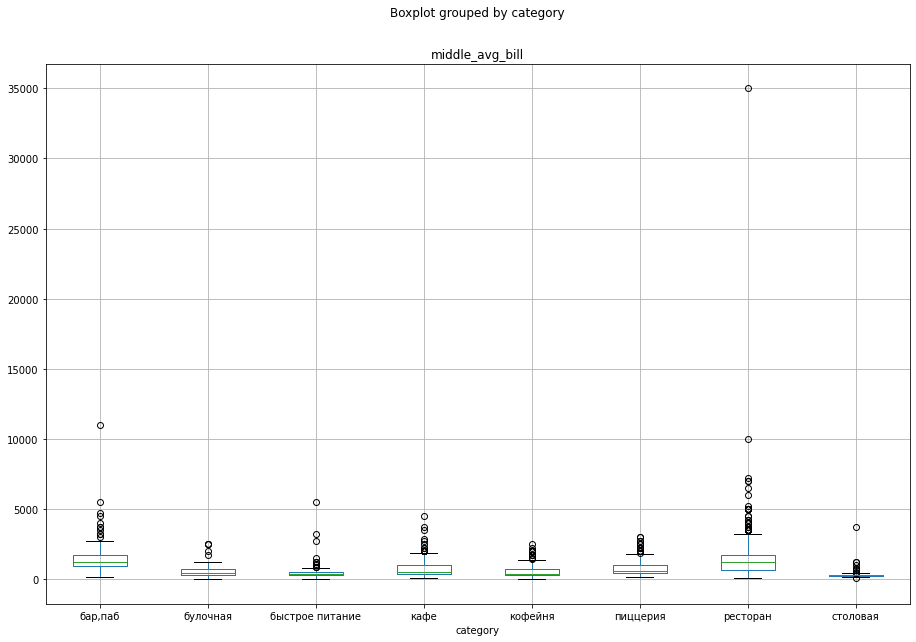

In [11]:
#найдем аномальные, выбивающиеся значения по категорям для middle_avg_bill
#find abnormal, out-of-order values for middle_avg_bill
places_df.boxplot(column='middle_avg_bill', by='category', figsize=(15, 10))
plt.show()

In [12]:
print('число заведений со средним счетом более 30 000: ', places_df[places_df['middle_avg_bill']>30000]['name'].count())

число заведений со средним счетом более 30 000:  1


In [13]:
#найдем этот ресторан
#find this restoraunt
places_df[places_df['middle_avg_bill']>30000]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_27/7
7177,Кафе,ресторан,"москва, каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.65745,37.646665,4.1,высокие,Средний счёт:20000–50000 ₽,35000.0,NaN,0,100.0,каширское шоссе,True


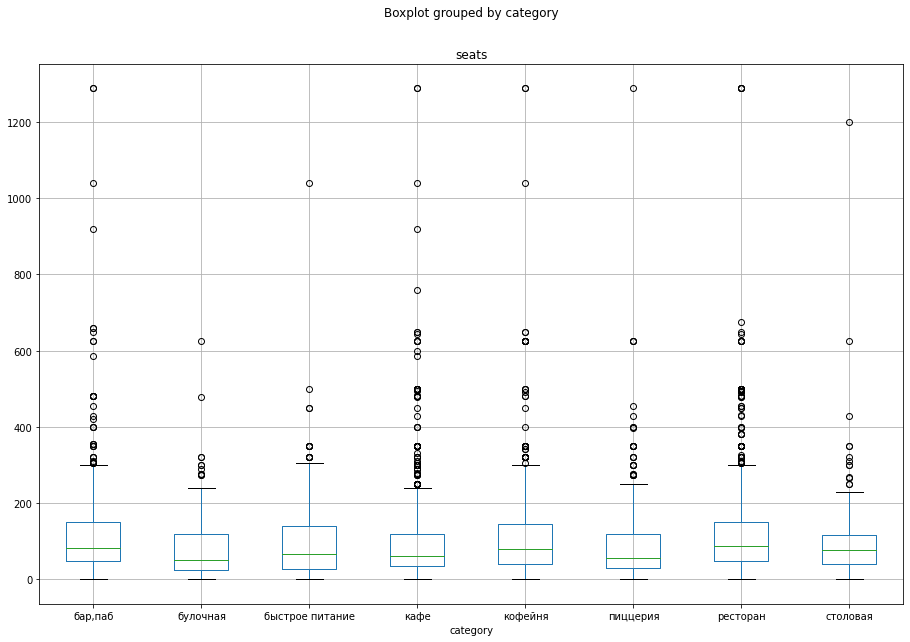

In [14]:
#найдем аномальные, выбивающиеся значения мест по категорям
#find abnormal, out-of-order values
places_df.boxplot(column='seats', by='category', figsize=(15, 10));

In [15]:
print('число заведений с посадкой более 700: ', places_df[places_df['seats']>700]['name'].count())

число заведений с посадкой более 700:  19


In [16]:
 print('число заведений с посадкой более 0: ', places_df[places_df['seats']>0]['name'].count())      

число заведений с посадкой более 0:  4659


In [17]:
seats_1 =  places_df[places_df['seats']>0].count()
print('Количество мест =', seats_1)

seats_2 = places_df[places_df['seats']>700].nunique()
print('Количество мест более 700 =', seats_2)

print(f'Потяря = {round((seats_1-seats_2)/seats_1*100,2)}%')

Количество мест = name                 4659
category             4659
address              4659
district             4659
hours                4369
lat                  4659
lng                  4659
rating               4659
price                2022
avg_bill             2325
middle_avg_bill      1958
middle_coffee_cup     286
chain                4659
seats                4659
street               4659
is_27/7              4659
dtype: int64
Количество мест более 700 = name                 19
category              7
address              10
district              2
hours                12
lat                  19
lng                  19
rating               11
price                 3
avg_bill              5
middle_avg_bill       4
middle_coffee_cup     0
chain                 2
seats                 5
street                5
is_27/7               2
dtype: int64
Потяря = name                  99.59
category              99.85
address               99.79
district              99.96
hours  

In [18]:
#создадим переменную для аномальных посадочных мест более 700
places_df_700 = places_df[places_df['seats'] > 700]

#удалим аномальные значения
#remove the anomal values
df = places_df.query('index not in @places_df_700.index')

#проверим наличие аномальных значений
#check for anomal values
print('Заведений с числом мест больше 700:', df[df['seats'] > 700]['name'].count())

Заведений с числом мест больше 700: 0


In [19]:
df

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_27/7
0,WoWфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,Четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,Хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,Иль Марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0,профсоюзная улица,False
8402,Миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0,пролетарский проспект,False
8403,Самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,люблинская улица,True
8404,Чайхана Sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,люблинская улица,True


Верояно, что у любого заведения будет какое-либо выбивающееся значение или уникальный случай, например провели свадьбу для олигирха с очень большим бюджетом. Так, для категорий "ресторан", "бар-паб" - это не исключение. Даже для "столовой" - вед могли провести корпоратив.

Что касается посадочных мест, то число заведений с посадкой более 700 мест - 19, что составляет меньше 1%. Принято решение не рассматриать данные 19 заведений с количеством посадочных мест более 700 человек.

Так определено, что средний счет на сумму выше 30 000 был только у одного заведения. Это явное аномальное значение, однако мы его пока оставим (хотя оно и не находится в центре столицы), поскольку у него 100 посадочных мест, . Видимо оно относится к категории "элитных". Более того, заявленный средний чек данного ресторана от 20 000 до 50 000 рублей.
___
It is likely that any institution will have some outstanding value or a unique case, for example, a wedding was held for an oligarch with a very large budget. So, for the categories "restaurant", "bar-pub" is no exception. Even for the "dining room" - after all, they could hold a corporate party.

As for seats, the number of establishments with seating more than 700 seats is 19, which is less than 1%. It was decided not to consider the data of 19 establishments with more than 700 seats.

It was determined that only one institution had an average bill of more than 30,000. This is clearly an abnormal value, but we will leave it for now (although it is not located in the center of the capital), since it has 100 seats. Apparently it belongs to the category of "elite". Moreover, the declared average check of this restaurant is from 20,000 to 50,000 rubles.

# Шаг 3. Анализ данных  <a id='intro_3'></a>
3.1 Какие категории заведений представлены в данных? Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

3.2 Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.

3.3 Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?
Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

3.4 Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. 
Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?


3.5 Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

3.6 Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

3.7 Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. 
Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).

3.8 Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

3.9 Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

3.10 Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

3.11 Значения средних чеков заведений хранятся в столбце `middle_avg_bill`. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. 

3.12 Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. 

3.13 Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

 <a id='intro_1.3'></a>

___
**3.1**

**Какие категории заведений представлены в данных?** 

**Постройте визуализации.**

**Ответьте на вопрос о распределении заведений по категориям.**

In [20]:
#группировка по категориям
#grouping by category
category = df.groupby('category')['name'].count().reset_index()

#переименовываем название name на count
#rename name on count
category.columns = ['category', 'count']
category

,category,count
0,"бар,паб",761
1,булочная,256
2,быстрое питание,602
3,кафе,2373
4,кофейня,1410
5,пиццерия,632
6,ресторан,2039
7,столовая,314


In [21]:
#строим диаграмму с сегментами
#building a diagram with segments
fig = go.Figure(data=[go.Pie(labels=category['category'], # указываем значения, которые появятся на метках сегментов
                             values=category['count'], # указываем данные, которые отобразятся на графике
                             pull = [0, 0, 0, 0.1])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Доля заведений по категориям', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Количество заведений',
                                    showarrow=False)])
fig.show() # выводим график

In [22]:
#строим столбчатую диаграмму 
#building a bar chart
fig = px.bar(category, # группировка
             x='category', # указываем столбец с данными для оси X
             y='count', # указываем столбец с данными для оси Y
             text='count' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Распределение заведений по категориям',
                   xaxis_title='Количество',
                   yaxis_title='Категории',
                   xaxis={'categoryorder':'total descending'})
fig.show() # выводим график


На 1 месте представлена такая категория как  кафе, что составляет 28.3% от общей доли.
На 2 месте - ресторан - 24.3%
На 3 месте - кофейня - 16.8%.
Последнее место в рейтинге занимает булочная - всего 3.05%.
___
On the 1st place, such a category as a cafe is represented, which is 28.3% of the total share.
On the 2nd place - restaurant - 24.3%
On the 3rd place - a coffee shop - 16.8%.
The last place in the rating is occupied by a bakery - only 3.05%.

___
**3.2**

**Исследуйте количество посадочных мест в местах по категориям**

**Постройте визуализации.**

**Проанализируйте результаты и сделайте выводы.**

In [23]:
df.groupby('category')['seats'].describe().round(2)

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
"бар,паб",464.0,115.83,110.05,0.0,48.00,81.0,143.75,660.0
булочная,148.0,89.39,97.69,0.0,25.00,50.0,120.00,625.0
быстрое питание,348.0,96.19,94.02,0.0,27.25,65.0,136.25,500.0
кафе,1213.0,93.55,99.85,0.0,35.00,60.0,116.00,650.0
кофейня,748.0,106.81,107.36,0.0,40.00,80.0,144.00,650.0
пиццерия,426.0,91.69,96.32,0.0,30.00,53.5,120.00,625.0
ресторан,1266.0,118.26,105.13,0.0,48.00,86.0,150.00,675.0
столовая,163.0,93.00,87.70,0.0,40.00,75.0,116.00,625.0


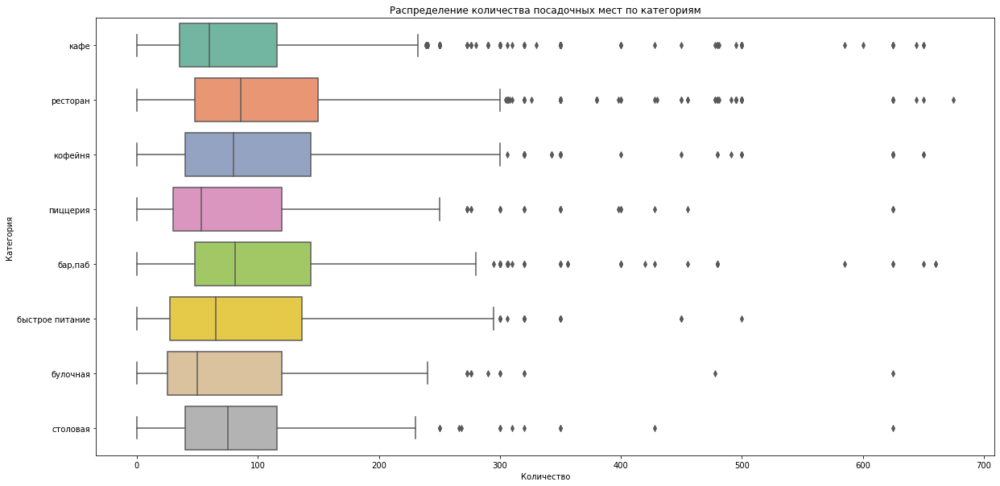

In [24]:
plt.figure(figsize=(20, 10))
ax = sns.boxplot(data=df, x='seats', y='category', palette="Set2")
#ax.set_xlim(-10,300)
plt.title('Распределение количества посадочных мест по категориям')
plt.xlabel('Количество')
plt.ylabel('Категория')
plt.show()

Наибольшее количество посадочны мест представлено в категории ресторан, кофейня и бар/паб. Это можно обьяснить проведением торжеств и корпоративов.
Медианное значение количества посадочных мест с бар/паб и рестораном - практически одинаково.
___
The largest number of seats is represented in the restaurant, coffee shop and bar/pub categories. This can be explained by holding celebrations and corporate parties.
The median value of the number of seats with a bar/pub and a restaurant is almost the same.

___
**3.3**

**Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете.**

**Каких заведений больше?**

**Какие категории заведений чаще являются сетевыми?**

**Исследуйте данные и ответьте на вопрос графиком.**

In [25]:
ratio_chain = df['chain'].value_counts().reset_index()
ratio_chain.columns = ['chain', 'count']
print(ratio_chain)

   chain  count
0      0   5191
1      1   3196


In [26]:
#визуализируем рапределение на круговой диграмме
#visualize the distribution on a pie chart

#ratio_chain.plot(kind='pie', y='count', figsize=(8,8));
fig = go.Figure(data=[go.Pie(labels=['несетевые = 0', 'сетевые = 1'], values=ratio_chain['count'])], layout=go.Layout(
        title=go.layout.Title(text="Распределение сетевых и несетевых заведений")))
fig.show()

Больше всего несетевых заведений - почти 62%
_____
Most of all non-chain establishments - almost 62%

____
**3.4** 

**Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе.**

**Постройте подходящую для такой информации визуализацию.**

**Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет?**

**К какой категории заведений они относятся?**

In [27]:
#срез сетевых заведений
#a cross-section of chain establishments
df_chain = df[df['chain'] == 1]

#группируем по названиям
#grouping by name

top_15 = df_chain.groupby('name').agg({'rating' : 'median', 'category' : pd.Series.mode, 'district' : 'count'})

#переименовываем столбец district
#rename column district
top_15 = top_15.rename(columns={'district':'district_count'})

#сортируем
#sorting
top_15 = top_15.sort_values('district_count', ascending=False).reset_index().head(15)
top_15

,name,rating,category,district_count
0,Шоколадница,4.20,кофейня,119
1,Домино'с Пицца,4.20,пиццерия,76
2,Додо Пицца,4.30,пиццерия,74
3,One Price Coffee,4.20,кофейня,70
4,Яндекс Лавка,4.00,ресторан,68
5,Cofix,4.10,кофейня,65
6,Prime,4.20,ресторан,50
7,Хинкальная,4.40,кафе,44
8,КОФЕПОРТ,4.20,кофейня,42
9,Кулинарная лавка братьев Караваевых,4.40,кафе,39


In [28]:
#визуализируем
#visualization

fig = px.bar(top_15, # загружаем top_15
             x='district_count', #столбец с данными для оси X
             y='name', #столбец с данными для оси Y
             text='district_count', # добавляем аргумент, который отобразит текст с информацией
             color='name'  # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Топ-15 популярных сетей в Москве',
                   xaxis_title='Количество',
                   yaxis_title='Название',
                   showlegend=False)
fig.show()

Наиболее популярна сеть - Шоколадница - 119 заведений, относится к категории кофейня.
На 2 и 3 месте - пиццерии: Домино'с Пицца (76) и Додо Пицца (74).

Практически все заведения данного списка топ_15 - очень хорошо знакомы кроме КОФЕПОРТ, CofeFest и Буханка.

В основном их объединят то, что они имеют доступный чек по которому потребитель может отдохнуть и поесть, в связи с чем и получили популярность.
___
The most popular chain is the Chocolate Shop - 119 establishments, belongs to the category of coffee shop.
On the 2nd and 3rd place - pizzerias: Domino's Pizza (76) and Dodo Pizza (74).

Almost all establishments of this list of top_15 are very familiar except for the COFFEE SHOP, CofeFest and Loaf.

Basically, they will be united by the fact that they have an affordable receipt for which the consumer can relax and eat, and therefore they have gained popularity.


___
**3.5**

**Какие административные районы Москвы присутствуют в датасете?**

**Отобразите общее количество заведений и количество заведений каждой категории по районам.**

**Попробуйте проиллюстрировать эту информацию одним графиком.**

In [29]:
print('Административные районы Москвы:')
print()
print(df['district'].unique())

Административные районы Москвы:

['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']


In [30]:
#сетевые по округам 
#chest by district
district_chain_df = (
    df_chain.groupby(['district', 'category']).agg({'rating' : 'median', 'name' : 'count'})
    .sort_values('rating', ascending = False).reset_index())
    
district_chain_df = district_chain_df.rename(columns={'name':'count'})
district_chain_df.head(15)

,district,category,rating,count
0,Западный административный округ,"бар,паб",4.60,8
1,Центральный административный округ,"бар,паб",4.50,73
2,Северо-Западный административный округ,"бар,паб",4.45,2
3,Юго-Западный административный округ,"бар,паб",4.40,11
4,Центральный административный округ,булочная,4.40,39
5,Центральный административный округ,пиццерия,4.40,48
6,Северный административный округ,"бар,паб",4.40,20
7,Западный административный округ,ресторан,4.40,87
8,Юго-Восточный административный округ,"бар,паб",4.40,10
9,Центральный административный округ,кафе,4.40,218


In [31]:
print('Административные районы Москвы в которых расположены только сетевые заведения')
print()
print(district_chain_df['district'].unique())

Административные районы Москвы в которых расположены только сетевые заведения

['Западный административный округ' 'Центральный административный округ'
 'Северо-Западный административный округ'
 'Юго-Западный административный округ' 'Северный административный округ'
 'Юго-Восточный административный округ' 'Южный административный округ'
 'Северо-Восточный административный округ'
 'Восточный административный округ']


In [32]:
#всего по округам 
#total by district
district_total_df = (
    df.groupby(['district', 'category']).agg({'rating' : 'median', 'name' : 'count'})
    .sort_values('rating', ascending = False).reset_index())
    
district_total_df = district_total_df.rename(columns={'name':'count'})
district_total_df.head(15)

,district,category,rating,count
0,Центральный административный округ,"бар,паб",4.50,364
1,Западный административный округ,"бар,паб",4.50,47
2,Северо-Западный административный округ,"бар,паб",4.40,23
3,Центральный административный округ,ресторан,4.40,670
4,Центральный административный округ,пиццерия,4.40,113
5,Юго-Западный административный округ,"бар,паб",4.40,38
6,Центральный административный округ,булочная,4.40,50
7,Южный административный округ,"бар,паб",4.40,68
8,Южный административный округ,булочная,4.40,25
9,Юго-Восточный административный округ,"бар,паб",4.40,38


In [33]:
#общее количество СЕТЕВЫХ заведений и количество заведеений по районам на одном графике
##the total number of establishments and the number of establishments by district on the same graph

fig = px.bar(district_chain_df, #загружаем огругов с сетевыми
             x='count', #с данными для оси X
             y='district', #столбец с данными для оси Y
             #text='district', # добавляем аргумент, который отобразит текст с информацией
             #barmode='group',                   
             color='category'
            )
# оформляем график
fig.update_layout(title='Количество СЕТЕВЫХ заведений каждой категории по районам',
                   xaxis_title='Количество',
                   yaxis_title='Название округа (района)',
                   yaxis={'categoryorder':'total ascending'})
fig.show()

In [34]:
#общее количество заведений и количество заведеений по районам на одном графике
##the total number of establishments and the number of establishments by district on the same graph

fig = px.bar(district_total_df, #загружаем округи без деления на сетевые
             x='count', #с данными для оси X
             y='district', #столбец с данными для оси Y
             #text='district', # добавляем аргумент, который отобразит текст с информацией
             #barmode='group',                   
             color='category'
            )
# оформляем график
fig.update_layout(title='Количество заведений каждой категории по районам',
                   xaxis_title='Количество',
                   yaxis_title='Название округа (района)',
                   yaxis={'categoryorder':'total ascending'})
fig.show()

В датасете с сетевыми заведениями присутствуют все 9 административных округов (районов), как и в общем датасете.

Больше всего заведений конечно же в ЦАО (центральный административный округ).

В СЗАО (северо-западный административный округ) отсутствуют сети с барами, пабами.
___
All 9 administrative districts (districts) are present in the dataset with network establishments, as well as in the general dataset.

Most of the establishments are, of course, in the CAO (central administrative district).

There are no chains with bars and pubs in the North-western administrative district.

___
**3.6** 

**Визуализируйте распределение средних рейтингов по категориям заведений.**

**Сильно ли различаются усреднённые рейтинги в разных типах общепита?**

In [35]:
#рейтинг сетевых по категориям
#rating chain on category
rating_cat_chain = df_chain.groupby('category').agg({'rating' : 'mean'}).round(2).sort_values('rating', ascending = False).reset_index()
rating_cat_chain

,category,rating
0,"бар,паб",4.39
1,булочная,4.29
2,пиццерия,4.28
3,столовая,4.24
4,ресторан,4.23
5,кофейня,4.21
6,кафе,4.20
7,быстрое питание,4.06


In [36]:
fig = px.bar(rating_cat_chain, # загружаем данные 
             x='rating', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='rating', # добавляем аргумент, который отобразит текст с информацией
             color='category'                   
            )
# оформляем график
fig.update_layout(title='Распределение средних рейтингов по категориям заведений для сетевых',
                   xaxis_title='Рейтинг',
                   yaxis_title='Название категорий')
fig.update_xaxes(range=[4, 4.5])
fig.show()

In [37]:
#рейтинг несетевых по категориям
#rating of non-chain by category

non_chain_df = df[df['chain'] == 0]
rating_cat_non_chain = non_chain_df.groupby('category').agg({'rating' : 'mean'}).round(2).sort_values('rating', ascending = False).reset_index()
rating_cat_non_chain

,category,rating
0,"бар,паб",4.39
1,кофейня,4.35
2,ресторан,4.33
3,пиццерия,4.32
4,булочная,4.24
5,столовая,4.20
6,кафе,4.09
7,быстрое питание,4.05


In [38]:
fig = px.bar(rating_cat_non_chain, # загружаем данные 
             x='rating', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='rating', # добавляем аргумент, который отобразит текст с информацией
             color='category'                   
            )
# оформляем график
fig.update_layout(title='Распределение средних рейтингов по категориям заведений для НЕСЕТЕВЫХ',
                   xaxis_title='Рейтинг',
                   yaxis_title='Название категорий')
fig.update_xaxes(range=[4, 4.5])
fig.show()

In [39]:
#рейтинг без деления на сетевые по категориям
#rating on category without division
rating_cat = df.groupby('category').agg({'rating' : 'mean'}).round(2).sort_values('rating', ascending = False).reset_index()
rating_cat

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


In [40]:
fig = px.bar(rating_cat, # загружаем данные 
             x='rating', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='rating', # добавляем аргумент, который отобразит текст с информацией
             color='category'                   
            )
# оформляем график
fig.update_layout(title='Распределение средних рейтингов по категориям всех заведений',
                   xaxis_title='Рейтинг',
                   yaxis_title='Название категорий')
fig.update_xaxes(range=[4, 4.5])
fig.show()

Если смотреть по всем заведениям, без выделения сетевые - то наибольший отрыв в рейтинге имеет категория бар, паб.

Что касается **сетевых**, то имеется распределение 3-ки лидеров-категорий следующие:
* 1 - бар, паб
* 2 - булочная
* 3 - пиццерия

"Количество - переходит в качество"

Что касается **НЕСЕТЕВЫХ**, то имеется распределение 3-ки лидеров-категорий следующие:
* 1 - бар, паб
* 2 - кофейня
* 3 - ресторан

Отличие от "сетевого" рейтинга в том, что потребителям больше всего нравится посещать уникальные, несетевые кофейни и рестораны.

Что касается **всех заведений без разделения**, то имеется распределение 3-ки лидеров-категорий следующие:
* 1 - бар, паб
* 2 - пиццерия
* 3 - ресторан

Большое общее количество таких заведений как бар/паб, пиццерия, ресторан - откликаются на общем рейтинге.
Как говорится, спрос рождает предложение. 

Кофейня занимает 4 место в распределени средних рейтингов во "всех заведениях без разделения".
Вероятно, чтобы попить кофе уже не нужно искать специальное для этого место. Практически в любом из категории общественного питания можно насладиться данным напитком, даже в пиццерии.

Кафэ и быстрое питание заняли одинаково последние места в распределени средних рейтингов как в сетевых, несетевых, так и суммарно.
___
If you look at all establishments, without highlighting the network ones, then the bar, pub category has the largest gap in the rating.

As for **network**, there is a distribution of 3 leaders-the following categories:
* 1 - bar, pub
* 2 - bakery
* 3 - pizzeria

"Quantity - turns into quality"

As for **NON-CHAIN**, there is a distribution of 3 leaders-the following categories:
* 1 - bar, pub
* 2 - coffee shop
* 3 - restaurant

The difference from the "network" rating is that consumers most like to visit unique, non-network coffee shops and restaurants.

As for **all establishments without division**, there is a distribution of 3 leaders-the following categories:
* 1 - bar, pub
* 2 - pizzeria
* 3 - restaurant

A large total number of establishments such as a bar / pub, pizzeria, restaurant - respond to the overall rating.
As they say, demand creates supply. 

The coffee shop ranks 4th in the distribution of average ratings in "all establishments without separation".
Probably, to drink coffee, you no longer need to look for a special place for this. In almost any of the catering categories, you can enjoy this drink, even in a pizzeria.

Cafe and fast food took the same last places in the distribution of average ratings both in network, non-network, and in total.

_____
**3.7** 

**Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.**

Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson

In [41]:
#средний рейтинг
#mean rating
rating_df = df.groupby('district', as_index=False)['rating'].agg('mean').round(2)
rating_df

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [42]:
#импорт json для работы с JSON-форматом
#import json for work with JSON-format
import json

#читаем файл admin_level_geomap.geojson
#read file admin_level_geomap.geojson
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [43]:
# импортируем карту и хороплет
#import map and choropleth
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
#loading JSON-file with the borders of Moscow districts

state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

#создаём карту Москвы
#creating map of Moscow
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
#creating choropleth with Choropleth-constructor and add it to the map
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    #fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по округам',
).add_to(m)

# выводим карту
m

Так, наименьший средний рейтинг - меньше 4.15 сформирован в ЮВАО (Юго-Восточный административный округ) - что и отражено на хороплете самой светлой зоной.
___
Thus, the lowest average rating - less than 4.15 was formed in the South-Eastern Administrative District (South-Eastern Administrative District) - which is reflected on the choroplete by the lightest zone.

___
**3.8**

**Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.**


In [44]:
#импортируем карту и маркер
#import map and marker

from folium import Map, Marker

#импортируем кластер
#import MarkerCluster
from folium.plugins import MarkerCluster

#moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

#создаём карту Москвы
#creating Moscow map
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
#writing function for marker_cluster
def clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(clusters, axis=1)

# выводим карту
m

**3.9**

**Найдите топ-15 улиц по количеству заведений.**

**Постройте график распределения количества заведений и их категорий по этим улицам.**

Попробуйте проиллюстрировать эту информацию одним графиком.

In [45]:
#срез улиц без пропусков
#cross-section of streets without null
streets_moscow = df[df['street'].notnull()]
top_15_streets = streets_moscow['street'].value_counts().reset_index().head(15)
top_15_streets.columns = ['street_name', 'count']
top_15_streets

,street_name,count
0,проспект мира,184
1,профсоюзная улица,122
2,ленинский проспект,107
3,проспект вернадского,97
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,76
8,ленинградское шоссе,70
9,мкад,65


In [46]:
#таблица с названиями улиц и категорий
#table with street names and categories
table_streets_cat = df.groupby(['street', 'category'])['name'].count().reset_index()
table_streets_cat.columns = ['street_name', 'category', 'count']
table_streets_cat.sort_values('count', ascending=False)

,street_name,category,count
2136,проспект мира,кафе,53
1519,мкад,кафе,45
2139,проспект мира,ресторан,45
2137,проспект мира,кофейня,36
2148,профсоюзная улица,кафе,35
...,...,...,...
1535,молодёжная улица,кофейня,1
1537,монтажная улица,кофейня,1
1538,монтажная улица,ресторан,1
1539,москворецкая набережная,кофейня,1


In [47]:
#оставим только улицы из top_15_streets
#leave streets only from top_15_streets
table_streets_15_cat = table_streets_cat[table_streets_cat['street_name'].isin(top_15_streets['street_name'])]
table_streets_15_cat

,street_name,category,count
698,варшавское шоссе,"бар,паб",6
699,варшавское шоссе,быстрое питание,7
700,варшавское шоссе,кафе,18
701,варшавское шоссе,кофейня,14
702,варшавское шоссе,пиццерия,4
...,...,...,...
3173,улица миклухо-маклая,быстрое питание,4
3174,улица миклухо-маклая,кафе,21
3175,улица миклухо-маклая,кофейня,4
3176,улица миклухо-маклая,пиццерия,2


In [48]:
fig = px.bar(table_streets_15_cat, # загружаем данные и заново их сортируем
             x='count', # указываем столбец с данными для оси X
             y='street_name', # указываем столбец с данными для оси Y
             #text='district', # добавляем аргумент, который отобразит текст с информацией
             #barmode='group',                   
             color='category'
            )
# оформляем график
fig.update_layout(title='Количество заведений каждой категории по районам из топ 15 улиц',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название улиц',
                   yaxis={'categoryorder':'total ascending'}
                 )
fig.show() # выводим график

Не удивительно, что улица Проспект мира занимает 1 место в рейтинге количества заведений каждой категории из то_15 улиц, ведь это самая протяженная улица Москвы.
Профсоюзная улица, Ленинский проспект и Проспект вернадского - не только одни из самых продолжительных улиц, но и вблизи которых находятся крупные места отдыха и достопримечательности, которые ежедневно посещает огромное количество человек (центральный Парк культуры, Воробьевы горы, Лужники, Фрунзенская набережная, Третьяковская галерея, Музеон, МГУ и другие).
___
It is not surprising that Prospekt Mira Street takes 1st place in the ranking of the number of establishments of each category out of 15 streets, because this is the longest street in Moscow.
Trade Union Street, Leninsky Prospekt and Vernadsky Avenue are not only one of the longest streets, but also near which there are large recreation places and attractions that a huge number of people visit daily (Central Park of Culture, Vorobyovy Gory, Luzhniki, Frunzenskaya Embankment, Tretyakov Gallery, Museon, Moscow State University and others).

**3.10**
**Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?**

In [49]:
#считаем
#counting

one_object = df['street'].value_counts().reset_index()

#переименовываем
#rename
one_object.columns = ['street_name', 'cafe_count']

#выбираем 1 объект
#choose 1 object
one_object = one_object[one_object['cafe_count'] == 1]
one_object

,street_name,cafe_count
990,новая улица,1
991,курсовой переулок,1
992,лианозовский проезд,1
993,новосущёвская улица,1
994,5-я магистральная улица,1
...,...,...
1442,стахановская улица,1
1443,старый толмачёвский переулок,1
1444,2-я фрезерная улица,1
1445,улица клочкова,1


In [50]:
#добавим районы
#add areas
streets_cat_one = table_streets_cat[table_streets_cat['street_name'].isin(one_object['street_name'])]
streets_cat_one = streets_cat_one.groupby('category')['street_name'].count()
streets_cat_one

category
бар,паб             39
булочная             8
быстрое питание     23
кафе               159
кофейня             84
пиццерия            15
ресторан            93
столовая            36
Name: street_name, dtype: int64

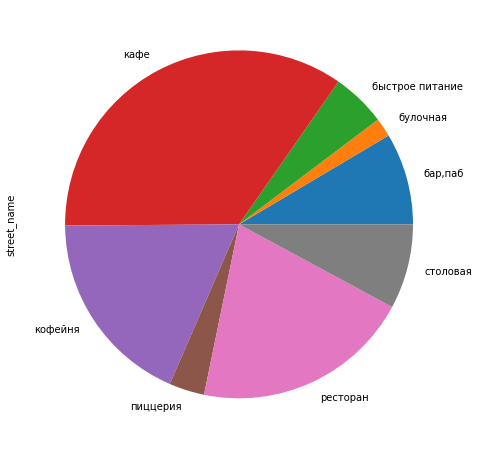

In [51]:
#визуализируем рапределение на круговой диграмме
#visualize the distribution on a pie chart

streets_cat_one.plot(kind='pie', y='count', figsize=(8,8));

In [52]:
go.Figure(data=[go.Pie(values=streets_cat_one)], 
          layout=go.Layout(title=go.layout.Title(text="Круговая диаграмма категорий заведений")))

Чаще всего на улицах с одиночными заведениями встречается такая категория как кафе.
___
Most often on the streets with single establishments there is such a category as cafes.

___
**3.11**

**Значения средних чеков заведений хранятся в столбце middle_avg_bill.**

**Посчитайте медиану этого столбца для каждого района.**

**Используйте это значение в качестве ценового индикатора района.**

In [53]:
median_avg_bill = df.groupby('district')['middle_avg_bill'].median().reset_index()
display(median_avg_bill)
print('Ценовой индикатор по округам:', median_avg_bill['middle_avg_bill'].mean().round(2))

,district,middle_avg_bill
0,Восточный административный округ,550.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


Ценовой индикатор по округам: 661.11


___
**3.12** 

**Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района.**

In [54]:
# создаём карту Москвы
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    #fill_color='YlGn',
    #fill_opacity=0.8,
    legend_name='Средний чек по округам',
).add_to(m2)

# выводим карту
m2

___
**3.13**

**Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?**

Так, наибольший ценовой индиатор отражен в ЦАО и ЗАО = 1000, а наименьший ЮВАО (Юго-Восточный административный округ) = 450. 

Цены в централном районе ваше как минимум в 1,5-2 раза.
___
Thus, the largest price indicator is reflected in the Central Administrative District and West Administrative District, and the smallest SEAO (South-Eastern Administrative District) = 450.

Prices in the central district are at least 1.5-2 times higher.

# Шаг 4. Детализируйте исследование  <a id='intro_4'></a>
Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

Сколько всего кофеен в датасете? 

В каких районах их больше всего, каковы особенности их расположения?

Есть ли круглосуточные кофейни?

Какие у кофеен рейтинги? Как они распределяются по районам?

На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

Постройте визуализации. Попробуйте дать рекомендацию для открытия нового заведения.

 <a id='intro_1.4'></a>

___
**Сколько всего кофеен в датасете?**

In [55]:
coffee_house = df[df['category'] == 'кофейня']
print('количество кофеен: ', coffee_house.shape[0])

количество кофеен:  1410


___

**В каких районах их больше всего, каковы особенности их расположения?**

In [56]:
# создаём карту Москвы
#creating Moscow map
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
#creating empty claster and add to the map
marker_cluster = MarkerCluster().add_to(m3)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_house.apply(clusters, axis=1)

# выводим карту
m3

больше всего кофеен в ЦАО.

___
**Есть ли круглосуточные кофейни?**



In [57]:
coffee_house_24_7 = coffee_house[coffee_house['is_27/7'] == True]
print('Круглосуточных коффен: ', coffee_house_24_7.shape[0])

Круглосуточных коффен:  59


In [58]:
# создаём карту Москвы
#creating Moscow map
m4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
#creating empty claster and add to the map
marker_cluster = MarkerCluster().add_to(m4)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_house_24_7.apply(clusters, axis=1)

# выводим карту
m4

Круглосуточные кофейни есть и большинстов из них в центре.
___
There are 24-hour coffee shops and most of them are in the center.

___
**Какие у кофеен рейтинги? Как они распределяются по районам?**



In [59]:
r_cofe_house = coffee_house.groupby('district', as_index=False)['rating'].agg('mean').round(2).sort_values('rating', ascending=False)
r_cofe_house

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.19


In [60]:
# создаём карту Москвы
m5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=r_cofe_house,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    #fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m5)

# выводим карту
m5

В очередной раз количество переходит в качество. Наибольший рейтинг в ЦАО - там где больше всего кофеен, в том числе круглосуточных и в СЗАО (Северо-Западный административный округ).

Наименьший - Западный административный округ.
___
Once again, quantity turns into quality. The highest rating in the Central Administrative District is where there are the most coffee shops, including round-the-clock ones, and in the North-Western Administrative District (North-Western Administrative District).

The smallest is the Western Administrative District.

___
**На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?**



In [61]:
price_cap = coffee_house.groupby('district', as_index=False)['middle_coffee_cup'].agg('mean').round(2).sort_values('middle_coffee_cup', ascending=False)
display(price_cap)
print('Средняя стоимость чашки кофе в Москве:', price_cap['middle_coffee_cup'].mean().round(2))

,district,middle_coffee_cup
1,Западный административный округ,189.94
5,Центральный административный округ,187.52
7,Юго-Западный административный округ,184.18
0,Восточный административный округ,174.02
2,Северный административный округ,165.79
4,Северо-Западный административный округ,165.52
3,Северо-Восточный административный округ,165.33
8,Южный административный округ,158.49
6,Юго-Восточный административный округ,151.09


Средняя стоимость чашки кофе в Москве: 171.32


In [62]:
# создаём карту Москвы
m6 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=price_cap,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    #fill_opacity=0.8,
    legend_name='Средняя цена чашки кофе по районам',
).add_to(m6)

# выводим карту
m6

Средняя чашка кофе по Москве - 171.32
Максимальная цена у становлена в ЗАО (Западный административный округ) = 189.94 (дороже чем на 10 рублей).
Также ЦАО и Юго-Западный административный округ - предлагают чашку кофе по одним из самых высоких средних цен: 187.52 и 184.18 соответственно.
___
Average cup of coffee in Moscow - 171.32
The maximum price is set in Western Administrative District = 189.94 (more expensive than 10 rubles).
Also, the Central Administrative District and the Southwestern Administrative District offer a cup of coffee at one of the highest average prices: 187.52 and 184.18, respectively.

# ОБЩИЙ ВЫВОД <a id='intro_5'></a>

На 1 месте представлена такая категория как  кафе, что составляет 28.3% от общей доли.
На 2 месте - ресторан - 24.3%
На 3 месте - кофейня - 16.8%.
Последнее место в рейтинге занимает булочная - всего 3.05%.

Наибольшее количество посадочны мест представлено в категории ресторан, кофейня и бар/паб. Это можно обьяснить проведением торжеств и корпоративов. Медианное значение количества посадочных мест с бар/паб и рестораном - практически одинаково.

Больше всего несетевых заведений - почти 62%

Наиболее популярна сеть - Шоколадница - 119 заведений, относится к категории кофейня.
На 2 и 3 месте - пиццерии: Домино'с Пицца (76) и Додо Пицца (74).

Практически все заведения данного списка топ_15 - очень хорошо знакомы кроме КОФЕПОРТ, CofeFest и Буханка.

В основном их объединят то, что они имеют доступный чек по которому потребитель может отдохнуть и поесть, в связи с чем и получили популярность.

В датасете с сетевыми заведениями присутствуют все 9 административных округов (районов), как и в общем датасете.

Больше всего заведений конечно же в ЦАО (центральный административный округ).

В СЗАО (северо-западный административный округ) отсутствуют сети с барами, пабами.

Если смотреть по всем заведениям, без выделения сетевые - то наибольший отрыв в рейтинге имеет категория бар, паб.

Что касается сетевых, то имеется распределение 3-ки лидеров-категорий следующие:

1 - бар, паб
2 - булочная
3 - пиццерия
"Количество - переходит в качество"

Что касается НЕСЕТЕВЫХ, то имеется распределение 3-ки лидеров-категорий следующие:

1 - бар, паб
2 - кофейня
3 - ресторан
Отличие от "сетевого" рейтинга в том, что потребителям больше всего нравится посещать уникальные, несетевые кофейни и рестораны.

Что касается всех заведений без разделения, то имеется распределение 3-ки лидеров-категорий следующие:

1 - бар, паб
2 - пиццерия
3 - ресторан
Большое общее количество таких заведений как бар/паб, пиццерия, ресторан - откликаются на общем рейтинге. Как говорится, спрос рождает предложение.

Кофейня занимает 4 место в распределени средних рейтингов во "всех заведениях без разделения". Вероятно, чтобы попить кофе уже не нужно искать специальное для этого место. Практически в любом из категории общественного питания можно насладиться данным напитком, даже в пиццерии.

Кафэ и быстрое питание заняли одинаково последние места в распределени средних рейтингов как в сетевых, несетевых, так и суммарно.

Так, наименьший средний рейтинг - меньше 4.15 сформирован в ЮВАО (Юго-Восточный административный округ) - что и отражено на хороплете самой светлой зоной.

Не удивительно, что улица Проспект мира занимает 1 место в рейтинге количества заведений каждой категории из то_15 улиц, ведь это самая протяженная улица Москвы. Профсоюзная улица, Ленинский проспект и Проспект вернадского - не только одни из самых продолжительных улиц, но и вблизи которых находятся крупные места отдыха и достопримечательности, которые ежедневно посещает огромное количество человек (центральный Парк культуры, Воробьевы горы, Лужники, Фрунзенская набережная, Третьяковская галерея, Музеон, МГУ и другие).

Так, наибольший ценовой индиатор отражен в ЦАО и ЗАО = 1000, а наименьший ЮВАО (Юго-Восточный административный округ) = 450.

Цены в централном районе ваше как минимум в 1,5-2 раза.

При детальном анализе кофеен определено следующее:

Средняя чашка кофе по Москве - 171.32 

Максимальная цена у становлена в ЗАО (Западный административный округ) = 189.94 (дороже чем на 10 рублей). 

Также ЦАО и Юго-Западный административный округ - предлагают чашку кофе по одним из самых высоких средних цен: 187.52 и 184.18 соответственно.

Учитывая, что Основателям фонда «Shut Up and Take My Money» не боятся конкуренции, то вполне можно попробовать открыть крутую и кастомизированную кофейню в ЦАО или в Западном административном округе и стать кофейней с наивысшим рейтингом.

А если обратить внимание на то, что такая категория как бар/паб - имеет наивысшие рейтинги в независимости от того, сетевое то заведение или нет, то вероятно будет успешнее открыть кофейню-паб или кофейню-бар.


____
# GENEAL CONCLUSION <a id='intro_1.5'></a>

On the 1st place, such a category as a cafe is represented, which is 28.3% of the total share.
On the 2nd place - restaurant - 24.3%
On the 3rd place - a coffee shop - 16.8%.
The last place in the rating is occupied by a bakery - only 3.05%.

The largest number of seats is represented in the restaurant, coffee shop and bar/pub categories. This can be explained by holding celebrations and corporate events. The median value of the number of seats with a bar/pub and a restaurant is almost the same.

Most of all non-chain establishments - almost 62%

The most popular chain is the Chocolate Shop - 119 establishments, belongs to the category of coffee shop.
On the 2nd and 3rd place - pizzerias: Domino's Pizza (76) and Dodo Pizza (74).

Almost all establishments of this top_15 list are very familiar except for the COFFEE SHOP, CofeFest and Loaf.

Basically, they will be united by the fact that they have an affordable receipt for which the consumer can relax and eat, and therefore they have gained popularity.

All 9 administrative districts (districts) are present in the dataset with network establishments, as well as in the general dataset.

Most of the establishments are, of course, in the CAO (central administrative district).

There are no chains with bars and pubs in the NWAO (north-western administrative district).

If you look at all establishments, without highlighting the network ones, then the bar, pub category has the largest gap in the rating.

As for the network, there is a distribution of 3 leaders-the following categories:

1 - bar, pub
2 - bakery
3 - pizzeria
"Quantity - turns into quality"

As for NON-NETWORK, there is a distribution of 3 leaders-the following categories:

1 - bar, pub
2 - coffee shop
3 - restaurant
The difference from the "network" rating is that consumers most like to visit unique, non-network coffee shops and restaurants.

As for all establishments without division, there is a distribution of 3 leaders-the following categories:

1 - bar, pub
2 - pizzeria
3 - restaurant
A large total number of establishments such as a bar / pub, pizzeria, restaurant - respond to the overall rating. As they say, demand creates supply.

The coffee shop ranks 4th in the distribution of average ratings in "all establishments without separation". Probably, to drink coffee, you no longer need to look for a special place for this. In almost any of the catering categories, you can enjoy this drink, even in a pizzeria.

Cafe and fast food took the same last places in the distribution of average ratings both in network, non-network, and in total.

Thus, the lowest average rating - less than 4.15 was formed in the South-Eastern Administrative District (South-Eastern Administrative District) - which is reflected on the choroplete by the lightest zone.

It is not surprising that Prospekt Mira Street takes 1st place in the ranking of the number of establishments of each category out of 15 streets, because this is the longest street in Moscow. Trade Union Street, Leninsky Prospekt and Vernadsky Avenue are not only one of the longest streets, but also near which there are large recreation places and attractions that a huge number of people visit daily (Central Park of Culture, Vorobyovy Gory, Luzhniki, Frunzenskaya Embankment, Tretyakov Gallery, Museon, Moscow State University and others).

Thus, the largest price indicator is reflected in the CAO and CJSC = 1000, and the smallest SEAO (South-Eastern Administrative District) = 450.

Prices in the central district are at least 1.5-2 times higher.

A detailed analysis of coffee shops determined the following:

Average cup of coffee in Moscow - 171.32 

The maximum price is set in CJSC (Western Administrative District) = 189.94 (more expensive than 10 rubles). 

Also, the central district and the Southwestern Administrative District offer a cup of coffee at one of the highest average prices: 187.52 and 184.18, respectively.

Considering that the founders of the Shut Up and Take My Money foundation are not afraid of competition, it is quite possible to try to open a cool and customized coffee shop in the central distinct or in the Western Administrative District and become a coffee shop with the highest rating.

If you also pay attention to the fact that such a category as a bar / pub has the highest ratings, regardless of whether it is a chain institution or not, then it will probably be more successful to open a pub coffee shop or a coffee bar.

[В начало](#intro_0)`

[Шаг 1 - Загрузите данные и изучите общую информацию](#intro_1)

[Шаг 2 - Предобработка данных](#intro_2)

[Шаг 3 - Анализ данных](#intro_3)

[Шаг 4 - Детализируйте исследование](#intro_4)

[ОБЩИЙ ВЫВОД](intro_5)

[Презентация](intro_6)
______
[To the beginning](#intro)`

[Step 1 - Download the data and study the general information](#intro_1.1)

[Step 2 - Data Preprocessing](#intro_1.2)

[Step 3 - Data Analysis](#intro_1.3)

[Step 4 - Detail the study](#intro_1.4)

[GENERAL OUTPUT](intro_1.5)

[Presentation](intro_1.6)

# Ссылка на презентацию => <a id='intro_6'></a>
https://drive.google.com/file/d/1hQ3kjIluP-Z4hGH0VT5N-PrSlIph9Tiy/view?usp=sharing
___
Presentation => <a id='intro_1.6'></a>
https://drive.google.com/file/d/1hQ3kjIluP-Z4hGH0VT5N-PrSlIph9Tiy/view?usp=sharing